In [1]:
#!pip install torch
#!pip install pykeen

In [1]:
from pykeen.models import ERModel, RotatE, TuckER, TransD, TransE, TransH, ComplEx, DistMult
from pykeen.pipeline import pipeline
from pykeen.nn.modules import NormBasedInteraction
from torch import FloatTensor
from class_resolver import Hint, HintOrType, OptionalKwargs
from torch.nn import functional
from pykeen.nn.init import xavier_uniform_, xavier_uniform_norm_, xavier_normal_norm_, xavier_normal_
from pykeen.typing import Constrainer, Initializer
from pykeen.regularizers import Regularizer, LpRegularizer
from typing import Union, Any, ClassVar, Mapping, Type, Optional, Tuple, MutableMapping
from pykeen.utils import negative_norm_of_sum, tensor_product, clamp_norm, project_entity
from pykeen.constants import DEFAULT_EMBEDDING_HPO_EMBEDDING_DIM_RANGE
from pykeen.evaluation import RankBasedEvaluator
from pykeen.datasets import Nations, FB15k237
from torch.optim import Adam

d:\Рабочий стол мой\универ\Диплом\model\venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# TransE

In [ ]:
transe_epochs = []
result_transe_fb15k237 = pipeline(
    model=TransE,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 5},
    random_seed=1603073093
)
transe_epochs.append(result_transe_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [ ]:
result_transe_fb15k237 = pipeline(
    model=TransE,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 10},
    random_seed=1603073093
)
transe_epochs.append(result_transe_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [ ]:
result_transe_fb15k237 = pipeline(
    model=TransE,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 50},
    random_seed=1603073093
)
transe_epochs.append(result_transe_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [ ]:
result_transe_fb15k237 = pipeline(
    model=TransE,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 100},
    random_seed=1603073093
)
transe_epochs.append(result_transe_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [7]:
transe_epochs

[0.11515209823846817,
 0.13590292632579803,
 0.17356184124946594,
 0.18099358677864075]

# TransH

In [ ]:
transh_epochs = []
result_transh_fb15k237 = pipeline(
    model=TransH,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 5},
    random_seed=1603073093
)
transh_epochs.append(result_transh_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [27]:
transh_epochs

[0.17568200826644897]

In [ ]:
result_transh_fb15k237 = pipeline(
    model=TransH,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 10},
    random_seed=1603073093
)
transh_epochs.append(result_transh_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [29]:
transh_epochs

[0.17568200826644897, 0.17647197842597961]

In [ ]:
result_transh_fb15k237 = pipeline(
    model=TransH,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 50},
    random_seed=1603073093
)
transh_epochs.append(result_transh_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [31]:
transh_epochs

[0.17568200826644897, 0.17647197842597961, 0.1890994757413864]

In [ ]:
result_transh_fb15k237 = pipeline(
    model=TransH,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 100},
    random_seed=1603073093
)
transh_epochs.append(result_transh_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [13]:
transh_epochs

[0.17568200826644897,
 0.17647197842597961,
 0.1890994757413864,
 0.1894351610652823]

# TransD

In [ ]:
transd_epochs = []
result_transd_fb15k237 = pipeline(
    model=TransD,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 5},
    random_seed=1603073093
)
transd_epochs.append(result_transd_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [35]:
transd_epochs

[0.1457773596048355]

In [ ]:
result_transd_fb15k237 = pipeline(
    model=TransD,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 10},
    random_seed=1603073093
)
transd_epochs.append(result_transd_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [37]:
transd_epochs

[0.1457773596048355, 0.18307603895664215]

In [ ]:
result_transd_fb15k237 = pipeline(
    model=TransD,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 50},
    random_seed=1603073093
)
transd_epochs.append(result_transd_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [7]:
transd_epochs

[0.1457773596048355, 0.18307603895664215, 0.1913725334407562]

In [ ]:
result_transd_fb15k237 = pipeline(
    model=TransD,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 100},
    random_seed=1603073093
)
transd_epochs.append(result_transd_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [15]:
transd_epochs

[0.1457773596048355,
 0.18307603895664215,
 0.1913425334407562,
 0.1911763086157964]

# DistMult

In [ ]:
distmult_epochs = []
result_distmult_fb15k237 = pipeline(
    model=DistMult,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 5},
    random_seed=1603073093
)
distmult_epochs.append(result_distmult_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [12]:
distmult_epochs

[0.04249884560704231]

In [ ]:
result_distmult_fb15k237 = pipeline(
    model=DistMult,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 10},
    random_seed=1603073093
)
distmult_epochs.append(result_distmult_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [14]:
distmult_epochs

[0.04249884560704231, 0.10114811360836028]

In [ ]:
result_distmult_fb15k237 = pipeline(
    model=DistMult,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 50},
    random_seed=1603073093
)
distmult_epochs.append(result_distmult_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [16]:
distmult_epochs

[0.04249884560704231, 0.10114811360836028, 0.16930559277534485]

In [ ]:
result_distmult_fb15k237 = pipeline(
    model=DistMult,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 100},
    random_seed=1603073093
)
distmult_epochs.append(result_distmult_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [18]:
distmult_epochs

[0.04249884560704231,
 0.10114811360836028,
 0.16930559277534485,
 0.17628440260887146]

# TuckER

In [ ]:
tucker_epochs = []
result_tucker_fb15k237 = pipeline(
    model=TuckER,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 5},
    random_seed=1603073093
)
tucker_epochs.append(result_tucker_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [ ]:
result_tucker_fb15k237 = pipeline(
    model=TuckER,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 10},
    random_seed=1603073093
)
tucker_epochs.append(result_tucker_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [ ]:
result_tucker_fb15k237 = pipeline(
    model=TuckER,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 50},
    random_seed=1603073093
)
tucker_epochs.append(result_tucker_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [ ]:
tucker_epochs = []
result_tucker_fb15k237 = pipeline(
    model=TuckER,
    dataset='FB15k-237',
    training_kwargs={'num_epochs': 100},
    random_seed=1603073093
)
tucker_epochs.append(result_tucker_fb15k237.metric_results.to_flat_dict()['both.realistic.inverse_harmonic_mean_rank'])

In [16]:
tucker_epochs

[0.14661945402622223,
 0.1539420783519745,
 0.0461944304406643,
 0.04389429837465286]

# Построение графика

In [17]:
transe_epochs = [0, 0.11515209823846817,
 0.13590292632579803,
 0.17356184124946594,
 0.18099358677864075]

transh_epochs = [0, 0.17568200826644897,
 0.17647197842597961,
 0.1890994757413864,
 0.1894351610652823]

transd_epochs = [0, 0.1457773596048355,
 0.18307603895664215,
 0.1913425334407562,
 0.1911763086157964]

distmult_epochs = [0, 0.04249884560704231,
 0.10114811360836028,
 0.16930559277534485,
 0.17628440260887146]

tucker_epochs = [0, 0.14661945402622223,
 0.1539420783519745,
 0.0461944304406643,
 0.04389429837465286]

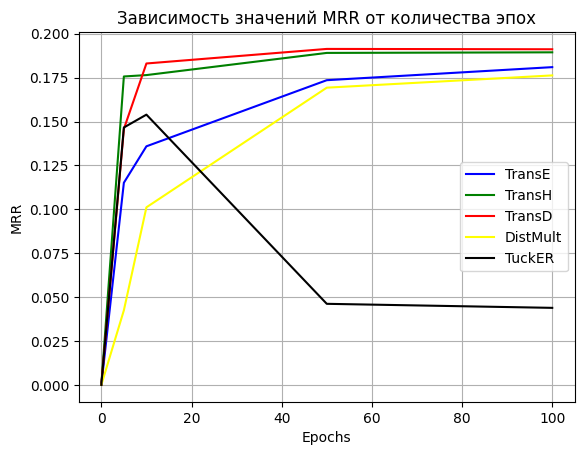

In [11]:
import matplotlib.pyplot as plt

plt.title('Зависимость значений MRR от количества эпох')
x = [0, 5, 10, 50, 100]
plt.plot(x, transe_epochs,'b', x, transh_epochs, 'g', x, transd_epochs, 'r', x, distmult_epochs, 'yellow', x, tucker_epochs, 'black')
plt.xlabel('Epochs')
plt.ylabel('MRR')
plt.legend(['TransE','TransH','TransD', 'DistMult', 'TuckER'])
plt.grid()
plt.show()